In [12]:
import jax
import jax.numpy as np
import numpy as onp
from lbi.pipeline.base import pipeline
from lbi.prior import SmoothedBoxPrior
import h5py
import torch
from simulator import simulator_func
import multiprocessing as mp
from flax.training import train_state, checkpoints
import optax

# from lbi.diagnostics import MMD, ROC_AUC, LR_ROC_AUC
from lbi.sampler import hmc
from lbi.dataset import getDataLoaderBuilder

from simulator import get_simulator, theta_addunits, theta_ranges

from simulator import get_simulator_with_more_observables
import limits_plots as lp

import corner
import matplotlib.pyplot as plt

from pipeline_kwargs import pipeline_kwargs

from jax.config import config

config.update("jax_disable_jit", True)

%load_ext autoreload
%autoreload 2

%matplotlib inline

%load_ext memory_profiler

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


In [2]:
def scale_X(x):
    """
    x: jax.numpy array
    """
    omega = np.atleast_2d(
        np.log10(np.clip(x[..., 0], a_min=1e-5, a_max=None)) * 2
    ).T

    gmuon = np.clip(x[..., 1], a_min=1e-11, a_max=1e-8)
    gmuon = np.atleast_2d(np.log10(gmuon) + 9.5).T

    mh = np.clip(x[..., 2], a_min=120)
    mh = np.atleast_2d((mh - 123.86377) / 2.2839).T

    out = [omega, gmuon, mh]

    if pipeline_kwargs["simulator_kwargs"]["use_direct_detection"]:
        # if exists, it'll always be 3rd
        xenon_pval = np.atleast_2d(
            np.clip(x[..., 3], a_min=None, a_max=X_true[:, 3])
        ).T
        out += [xenon_pval]

    if pipeline_kwargs["simulator_kwargs"]["use_atlas_constraints"]:
        # this will always be last
        atlas_pval = np.atleast_2d(
            np.clip(x[..., -1], a_min=None, a_max=X_true[:, -1])
        ).T
        out += [atlas_pval]

    out = np.hstack(out)

    return out

def scale_Theta(theta):
    """
    theta : jax.numpy array

    theta is uniform between 0 and 1
    """
    std = 0.70710678
    # return theta
    return (theta) / std


In [3]:
# --------------------------

seed = 1234
rng, model_rng, hmc_rng = jax.random.split(jax.random.PRNGKey(seed), num=3)

# --------------------------
# Create logger
# experiment_name = datetime.datetime.now().strftime("%s")
# experiment_name = f"{model_type}_{experiment_name}"
# logger = SummaryWriter("runs/" + experiment_name)
logger = None

# set up true model for posterior inference test

#Seems like every time I call get_simulator, the memory usage increases
simulate, obs_dim, theta_dim = get_simulator(**pipeline_kwargs["simulator_kwargs"])
# --------------------------
# The true values correspond to: omega, gmuon, mh, xenon pvals
X_true = [0.12, 251e-11, 125.0]
X_sigma = [0.005, 59e-11, 1.0]

if pipeline_kwargs["simulator_kwargs"]["use_direct_detection"]:
    X_true += [[0.5]]
    X_sigma += [1e-5]
if pipeline_kwargs["simulator_kwargs"]["use_atlas_constraints"]:
    X_true += [0.5]
    X_sigma += [1e-5]

X_true = np.array([X_true])
X_sigma = np.array(X_sigma)

print("X_true", X_true)
print("X_sigma", X_sigma)

# --------------------------
# set up prior
log_prior, sample_prior = SmoothedBoxPrior(
    theta_dim=theta_dim, lower=-1.0, upper=1.0, sigma=0.01
)

# Plot prior
lp.prior_plotter(sample_prior)

X_true [[1.20e-01 2.51e-09 1.25e+02 5.00e-01]]
X_sigma [5.0e-03 5.9e-10 1.0e+00 1.0e-05]


<Figure size 3280x3280 with 0 Axes>

In [7]:
model, log_prob, params, Theta_post = pipeline(
        rng,
        X_true,
        get_simulator,
        # Prior
        log_prior,
        sample_prior,
        # scaling
        sigma=X_sigma,
        scale_X=scale_X,
        scale_Theta=scale_Theta,
        **pipeline_kwargs,
    )

STARTING ROUND 1


  0%|          | 0/1 [00:00<?, ?it/s]

2
 There has been a problem during the run.
 Please check the file Messages.out for further information.
 Block 'HMIX', key={ 2} - is absent
can not calculate parameter tB
sortOddparticles err=50


100%|██████████| 1/1 [00:03<00:00,  3.88s/it]


Number of non-nan samples: 9


Mean valid loss: 0.8334:   0%|          | 120/250000 [00:26<15:03:29,  4.61it/s]

Patience reached


In [13]:
# learning_rate = 0.001
# tx = optax.chain(
#     # Set the parameters of Adam. Note the learning_rate is not here.
#     optax.scale_by_adam(b1=0.9, b2=0.999, eps=1e-8),
#     # Put a minus sign to *minimise* the loss.
#     optax.scale(-learning_rate),
# )
# state = train_state.TrainState.create(apply_fn=model.apply,
#                                       params=params,
#                                       tx=tx)

# CKPT_DIR = 'ckpts'
# checkpoints.save_checkpoint(ckpt_dir=CKPT_DIR, target=state, step=0)
# restored_state = checkpoints.restore_checkpoint(ckpt_dir=CKPT_DIR, target=state)

# assert jax.tree_util.tree_all(jax.tree_multimap(lambda x, y: (x == y).all(), state.params, restored_state.params))

AttributeError: module 'jax' has no attribute 'tree_multimap'

In [26]:
num_chains_results = 2
init_theta = sample_prior(rng, num_samples=num_chains_results)

In [38]:
init_theta[0].shape

(15,)

In [128]:
def gaussian_log_likelihood(theta):
    x = simulate(rng, theta, num_samples_per_theta=1) 
    return np.array([(-0.5 * (x - X_true) ** 2 / X_sigma ** 2)])

parallel_log_prob = jax.vmap(log_prob, in_axes=(0, None, None)) #This goes over the ensemble of classifiers

def potential_fn(theta):
    if len(theta.shape) == 1:
        theta = theta[None, :]

    log_P = log_prior(theta)
    log_L = parallel_log_prob(params, X_true, theta)
    log_L = log_L.mean(axis=0)

    log_post = -(log_L + log_P)
    
    return log_post.sum()

def potential_fn_gauss(theta):
    if len(theta.shape) == 1:
        theta = theta[None, :]

    log_P = log_prior(theta)
    log_L = gaussian_log_likelihood(theta)
    log_L = log_L.mean(axis=2)
    log_post = -(log_L + log_P)
    
    return log_post.sum()
 

: 

In [124]:
print(parallel_log_prob(params, X_true, init_theta[None,0]).mean(axis=0))
print(gaussian_log_likelihood(init_theta[None,1]).mean(axis=2))

[[-0.01669462]]


  0%|          | 0/1 [00:00<?, ?it/s]

1


100%|██████████| 1/1 [00:01<00:00,  1.17s/it]

[[-3.128113e+08]]


In [126]:
print(potential_fn(init_theta[0]))
print(potential_fn_gauss(init_theta[0]))

-55.043053


  0%|          | 0/1 [00:00<?, ?it/s]

1


100%|██████████| 1/1 [00:00<00:00,  1.04it/s]

4687501000.0


In [5]:
# def simulate_w_noise(theta, sigma):
#     x = simulate(rng, theta, num_samples_per_theta=1) 
#     # transform to data space, add gaussian noise, transform back
#     x = x + sigma * onp.random.randn(*x.shape)
#     return x

##Try simulating from micromegas
# x_w_noise = simulate_w_noise(init_theta, X_sigma)

# nan_idx_noise = onp.any(onp.isnan(x_w_noise), axis=1)
# x_noise = x_w_noise[~nan_idx_noise]
# theta_noise = init_theta[~nan_idx_noise]

In [92]:
num_chains_results = 32
init_theta = sample_prior(rng, num_samples=num_chains_results)

In [93]:
mcmc = hmc(
    rng,
    potential_fn,
    init_theta,
    adapt_step_size=True,
    adapt_mass_matrix=True,
    dense_mass=True,
    step_size=1e0,
    max_tree_depth=8,
    # num_warmup=2000,
    # num_samples=750,
    num_warmup=10,
    num_samples=10,
    num_chains=num_chains_results,
    extra_fields=("potential_energy",),
    chain_method="vectorized",
)
mcmc.print_summary()


sample: 100%|██████████| 20/20 [01:01<00:00,  3.07s/it]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
 Param:0[0]     -0.14      0.50     -0.15     -0.94      0.62    132.84      1.27
 Param:0[1]     -0.23      0.53     -0.27     -1.01      0.56    120.73      1.31
 Param:0[2]     -0.16      0.55     -0.20     -1.00      0.64    148.66      1.20
 Param:0[3]     -0.06      0.59     -0.08     -1.01      0.71    105.87      1.39
 Param:0[4]      0.19      0.51      0.30     -0.61      1.00    142.02      1.20
 Param:0[5]     -0.48      0.43     -0.61     -1.02      0.22    113.20      1.37
 Param:0[6]      0.34      0.49      0.47     -0.45      0.99    137.53      1.21
 Param:0[7]      0.22      0.54      0.32     -0.60      1.01    139.16      1.25
 Param:0[8]      0.22      0.55      0.29     -0.63      1.01    101.46      1.31
 Param:0[9]     -0.20      0.58     -0.35     -0.94      0.75     64.03      1.44
Param:0[10]     -0.14      0.53     -0.17     -1.01      0.61    113.22      1.29
Param:0[11]    

In [127]:
mcmc = hmc(
    rng,
    potential_fn_gauss,
    init_theta,
    adapt_step_size=True,
    adapt_mass_matrix=True,
    dense_mass=True,
    step_size=1e0,
    max_tree_depth=8,
    # num_warmup=2000,
    # num_samples=750,
    num_warmup=10,
    num_samples=10,
    num_chains=num_chains_results,
    extra_fields=("potential_energy",),
    chain_method="vectorized",
)
mcmc.print_summary()

  0%|          | 0/1 [00:00<?, ?it/s]

1


  0%|          | 0/1 [00:00<?, ?it/s]


ConcretizationTypeError: Abstract tracer value encountered where concrete value is expected: Traced<ShapedArray(float32[1,15])>with<JVPTrace(level=3/0)> with
  primal = Traced<ShapedArray(float32[1,15])>with<BatchTrace(level=1/0)> with
    val = DeviceArray([[[ 0.7646642 , -0.5315666 ,  0.6262903 ,  0.37693787,
               -0.7933705 ,  0.9926746 ,  0.27339005, -0.09167862,
                0.29962945, -0.9640074 ,  0.75448203,  0.91345596,
                0.0900209 ,  0.57772017, -0.99612045]],

             [[ 0.265491  , -0.30696678,  0.10989404, -0.6717441 ,
               -0.6250546 , -0.9859483 , -0.6838777 ,  0.37708902,
                0.53637505, -0.98334956, -0.3350587 ,  0.14519954,
                0.9237721 ,  0.5602045 ,  0.255018  ]],

             [[ 0.01942229,  0.6567583 ,  0.812989  ,  0.48510408,
               -0.78610086, -0.43749952, -0.5351498 ,  0.30459476,
               -0.37660742,  0.58633375,  0.35348082, -0.13683414,
                0.9576776 ,  0.03273344, -0.90233016]],

             [[-0.5461049 , -0.9207673 ,  0.84741926,  0.09773803,
               -0.33841467, -0.06867361,  0.9885309 ,  0.16043186,
               -0.6856196 ,  0.9443159 ,  0.21139956,  0.00549626,
                0.18675637, -0.9794531 ,  0.62263227]],

             [[-0.6114812 , -0.18808722,  0.2359736 , -0.38108325,
                0.03795099,  0.37624407,  0.8432052 , -0.6410525 ,
               -0.4021182 , -0.87597275, -0.5918486 , -0.06703925,
                0.10454154,  0.7431953 , -0.19822168]],

             [[-0.18538117,  0.18291926,  0.9625573 ,  0.5572963 ,
                0.25588322,  0.25197983,  0.29288793,  0.7523494 ,
                0.01694369, -0.31245136,  0.67284393,  0.08725643,
               -0.27421975, -0.34556198, -0.51850176]],

             [[-0.67114854,  0.8835571 ,  0.6047733 , -0.9320855 ,
               -0.87771964, -0.35448766, -0.07819772,  0.19052434,
                0.49293756,  0.34908152, -0.5063484 ,  0.5588002 ,
                0.99627614, -0.92849684,  0.60282636]],

             [[-0.5359092 ,  0.17809486, -0.74569726, -0.78017616,
               -0.03716397, -0.06710815, -0.20806932, -0.78901243,
               -0.674201  , -0.28150892, -0.81753635, -0.26473022,
                0.58188057, -0.0368681 ,  0.09384251]],

             [[ 0.20734811, -0.7107365 ,  0.07577181, -0.82829666,
               -0.07317472, -0.33965397, -0.61635685,  0.18162417,
                0.36838245, -0.79636645,  0.52719164,  0.64340115,
                0.68562484, -0.1884408 ,  0.6209419 ]],

             [[ 0.23341107, -0.5605974 ,  0.79753923, -0.02722812,
                0.713758  ,  0.8246887 , -0.21745276,  0.22996736,
                0.9280031 , -0.34363008,  0.47241902, -0.9888096 ,
                0.49741006, -0.8771174 , -0.2094059 ]],

             [[-0.18299031,  0.5705378 , -0.48365903,  0.87828064,
               -0.7801101 ,  0.43774867,  0.46553874, -0.8448448 ,
                0.285892  ,  0.72690153, -0.7362459 ,  0.9703069 ,
                0.63309765, -0.7669809 ,  0.9662247 ]],

             [[ 0.9296346 ,  0.9223139 ,  0.57371736,  0.3037572 ,
               -0.01420999,  0.84242654, -0.8267839 ,  0.7939966 ,
               -0.66663694,  0.4402845 ,  0.02363276,  0.04431343,
               -0.8961034 ,  0.00160742,  0.82471967]],

             [[-0.7716234 , -0.58726716, -0.79837656,  0.7554841 ,
               -0.6370609 ,  0.99948215,  0.7683244 , -0.13987565,
                0.10221076,  0.65347576,  0.5362654 ,  0.53194404,
               -0.5079441 , -0.64265156, -0.6813407 ]],

             [[-0.30159116, -0.30518174,  0.92094684, -0.00189662,
                0.1019187 , -0.6477816 , -0.8397422 , -0.57786775,
                0.6992152 , -0.25001526, -0.52798724, -0.68091226,
                0.52446055,  0.5239599 , -0.6114838 ]],

             [[-0.38936877,  0.6315868 ,  0.9834206 ,  0.6463859 ,
               -0.8847749 ,  0.61402106, -0.38555002,  0.8693795 ,
                0.24386096, -0.20196152,  0.14144707, -0.9435899 ,
               -0.28299356, -0.9657829 ,  0.36459732]],

             [[ 0.87425566,  0.06695199, -0.5982213 ,  0.6333177 ,
                0.0936842 , -0.6306956 , -0.44081473,  0.731143  ,
               -0.95850325,  0.15326762,  0.6715362 ,  0.211838  ,
                0.8648076 ,  0.673537  ,  0.5738752 ]],

             [[ 0.67503977, -0.65368605,  0.35987902, -0.32245636,
                0.8698745 ,  0.83481216,  0.10592556, -0.9285557 ,
                0.48618984,  0.49128222,  0.36947417,  0.61527276,
               -0.25139618,  0.65489626, -0.17038965]],

             [[ 0.40855098, -0.6304476 , -0.1131351 ,  0.49327588,
               -0.85224795,  0.04426455, -0.69653726, -0.76363707,
                0.26897025,  0.6664748 ,  0.790555  ,  0.47851992,
               -0.8181591 , -0.46461105, -0.24110055]],

             [[ 0.23666406, -0.60045385,  0.15268612, -0.70240784,
                0.7295728 , -0.34526896,  0.578851  , -0.64404655,
                0.8971262 ,  0.43465018, -0.40953112,  0.34680152,
                0.8010671 , -0.67084885, -0.5991552 ]],

             [[-0.71116734, -0.22425914, -0.4321978 ,  0.4311521 ,
               -0.88053274, -0.57502913, -0.13715982,  0.5574248 ,
                0.7085254 , -0.6489341 , -0.08023715, -0.75175047,
                0.36118698, -0.22709966, -0.9776411 ]],

             [[ 0.6492424 ,  0.0978055 ,  0.15609026,  0.4858241 ,
                0.98285365,  0.88099766, -0.3080051 ,  0.4595294 ,
                0.6459739 ,  0.87380004, -0.8612497 , -0.94744873,
                0.43789768,  0.5906925 , -0.5640905 ]],

             [[-0.66270137, -0.4117248 ,  0.08952665, -0.7322788 ,
                0.36380935, -0.21175146, -0.6759107 , -0.19869995,
               -0.93767357,  0.24983048,  0.0506258 ,  0.6605766 ,
               -0.76858616,  0.96002245,  0.03220439]],

             [[ 0.9149122 ,  0.5471883 , -0.7593496 ,  0.2060113 ,
               -0.08516884, -0.07195187,  0.1808033 , -0.1891756 ,
               -0.388474  , -0.84380627,  0.82150245, -0.10449958,
               -0.11465406,  0.5851252 ,  0.7329893 ]],

             [[ 0.35971713,  0.44460297, -0.5173795 , -0.51768446,
                0.8226211 , -0.03408647, -0.11467528,  0.1098597 ,
               -0.44224238, -0.7609532 , -0.9168794 , -0.06074595,
               -0.02315283, -0.29235697,  0.48473167]],

             [[-0.15781188, -0.1548984 ,  0.82398415, -0.21283698,
               -0.71379423, -0.19142318, -0.32622862, -0.90316105,
               -0.7881987 , -0.65851736, -0.63552403, -0.8464732 ,
               -0.5363815 , -0.08664179,  0.90373135]],

             [[-0.2327671 , -0.09194779,  0.5679097 ,  0.72060966,
               -0.0443809 ,  0.436728  ,  0.6011541 ,  0.45584798,
                0.1718905 ,  0.90383196, -0.14757395,  0.97100306,
                0.14191985,  0.72603154, -0.1889062 ]],

             [[-0.87800336, -0.54206586, -0.7957094 , -0.16593981,
               -0.59653187,  0.09381723,  0.7523899 ,  0.09936261,
                0.2325275 ,  0.02130079, -0.5361886 ,  0.57364964,
                0.8649099 ,  0.2218976 ,  0.5930867 ]],

             [[ 0.02261186, -0.19643879, -0.6977837 ,  0.9155896 ,
               -0.2692268 ,  0.7138636 , -0.47374535,  0.14375114,
                0.3796773 ,  0.58553123,  0.5807228 ,  0.26205587,
                0.6294694 ,  0.9107208 ,  0.6744487 ]],

             [[ 0.714571  ,  0.91859627, -0.6072295 , -0.05340362,
               -0.8124871 , -0.57347965,  0.34730244,  0.48875737,
                0.19549394, -0.16617465, -0.38480544,  0.12023354,
               -0.22149515,  0.25819802, -0.955369  ]],

             [[ 0.26920652,  0.71441317,  0.7899475 ,  0.02615857,
                0.7769077 ,  0.8560262 ,  0.28701544,  0.20747471,
               -0.9482887 , -0.5437908 ,  0.5650346 ,  0.8746214 ,
               -0.9058392 ,  0.4820621 ,  0.37449574]],

             [[ 0.72758603, -0.07887149,  0.6124699 , -0.6922972 ,
                0.27488446,  0.5141535 ,  0.6340325 ,  0.9729142 ,
                0.9279015 ,  0.39539027,  0.1050818 , -0.94655037,
               -0.78158426, -0.21710134,  0.6308141 ]],

             [[-0.08560085,  0.3240099 ,  0.6304891 , -0.98003054,
                0.40877128, -0.09824204,  0.06314182,  0.13104177,
                0.98249245,  0.63215923,  0.49962258, -0.643018  ,
                0.12865806, -0.28542614,  0.24482346]]], dtype=float32)
    batch_dim = 0
  tangent = Traced<ShapedArray(float32[1,15])>with<JaxprTrace(level=2/0)> with
    pval = (ShapedArray(float32[1,15]), None)
    recipe = JaxprEqnRecipe(eqn_id=<object object at 0x2fcc03b20>, in_tracers=(Traced<ShapedArray(float32[1,15]):JaxprTrace(level=2/0)>,), out_tracer_refs=[<weakref at 0x2fd05b4c0; to 'JaxprTracer' at 0x2fd05bba0>], out_avals=[ShapedArray(float32[1,15])], primitive=broadcast_in_dim, params={'shape': (1, 15), 'broadcast_dimensions': (0, 1)}, effects=set(), source_info=SourceInfo(traceback=<jaxlib.xla_extension.Traceback object at 0x2fd0868f0>, name_stack=NameStack(stack=(Transform(name='jvp'),))))
The error occurred in the __reduce__ method, which may indicate an attempt to serialize/pickle a traced value.

See https://jax.readthedocs.io/en/latest/errors.html#jax.errors.ConcretizationTypeError

In [12]:
samples = mcmc.get_samples(group_by_chain=False).squeeze()
# samples are unitless. let's scale them to the true values
unitful_samples = theta_addunits(samples)
# ignore squarks
unitful_samples = np.delete(unitful_samples, slice(11, 20), 1)

posterior_log_probs = -mcmc.get_extra_fields()["potential_energy"]
unitful_samples = np.hstack([unitful_samples, posterior_log_probs[:, None]])

labels = [
    r"$\mu$",
    r"$M_1$",
    r"$M_2$",
    r"$M_3$",
    r"$M_{L_1}$",
    r"$M_{L_2}$",
    r"$M_{L_3}$",
    r"$M_{r_1}$",
    r"$M_{r_2}$",
    r"$M_{r_3}$",
    # r"$M_{Q_1}$",
    # r"$M_{Q_2}$",
    # r"$M_{Q_3}$",
    # r"$M_{u_1}$",
    # r"$M_{u_2}$",
    # r"$M_{u_3}$",
    # r"$M_{d_1}$",
    # r"$M_{d_2}$",
    # r"$M_{d_3}$",
    r"$M_A$",
    r"$\tan\beta$",
    r"$A_t$",
    r"$A_b$",
    r"$A_{\tau}$",
]
labels += ["log prob"]
ranges = [
    [-2000, 2000],
    [-1200, 1200],
    [-2000, 2000],
    [400, 4000],
    [100, 4000],
    [100, 1000],
    [100, 4000],
    [100, 4000],
    [100, 1000],
    [100, 4000],
    [400, 4000],
    [1, 50],
    [-4000, 4000],
    [-4000, 4000],
    [-4000, 4000],
]
ranges = onp.array(ranges)

ranges = np.vstack(
    [ranges, np.array([(posterior_log_probs.min(), posterior_log_probs.max())])]
)

In [13]:
unitful_samples.shape

(3200, 16)

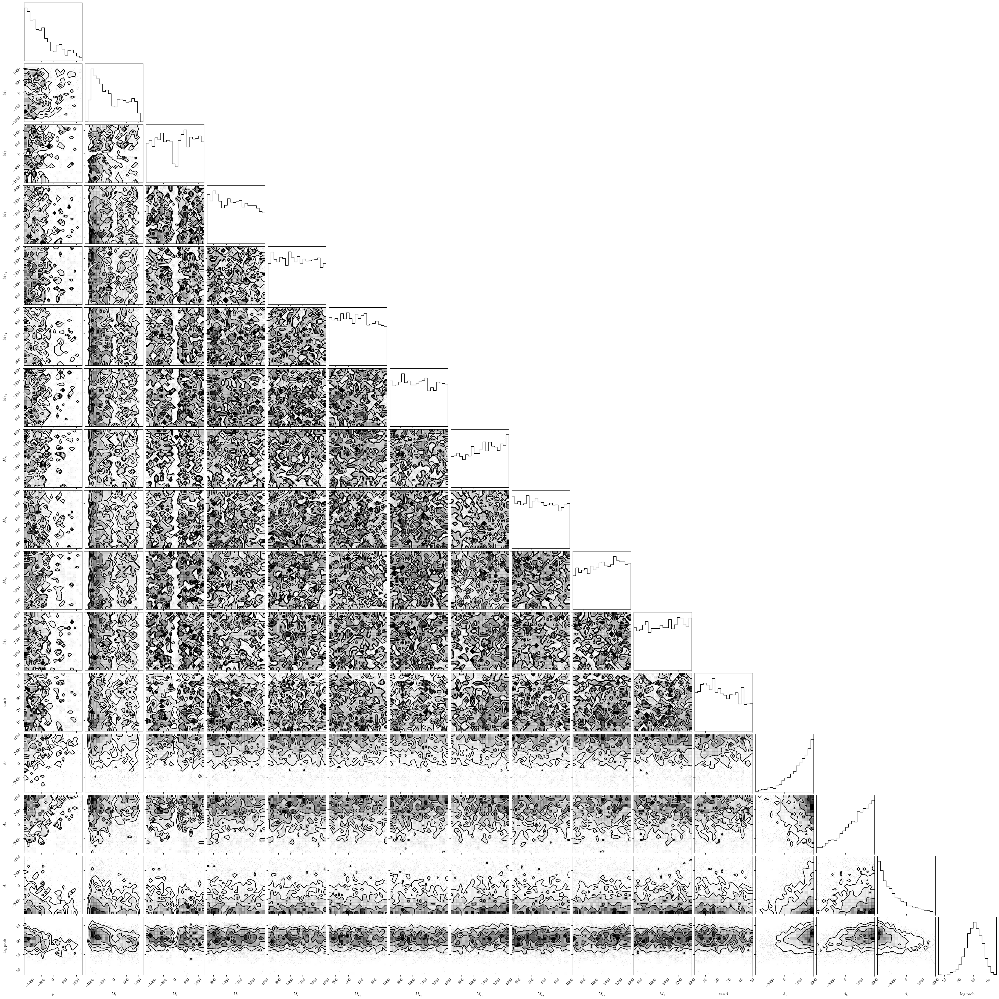

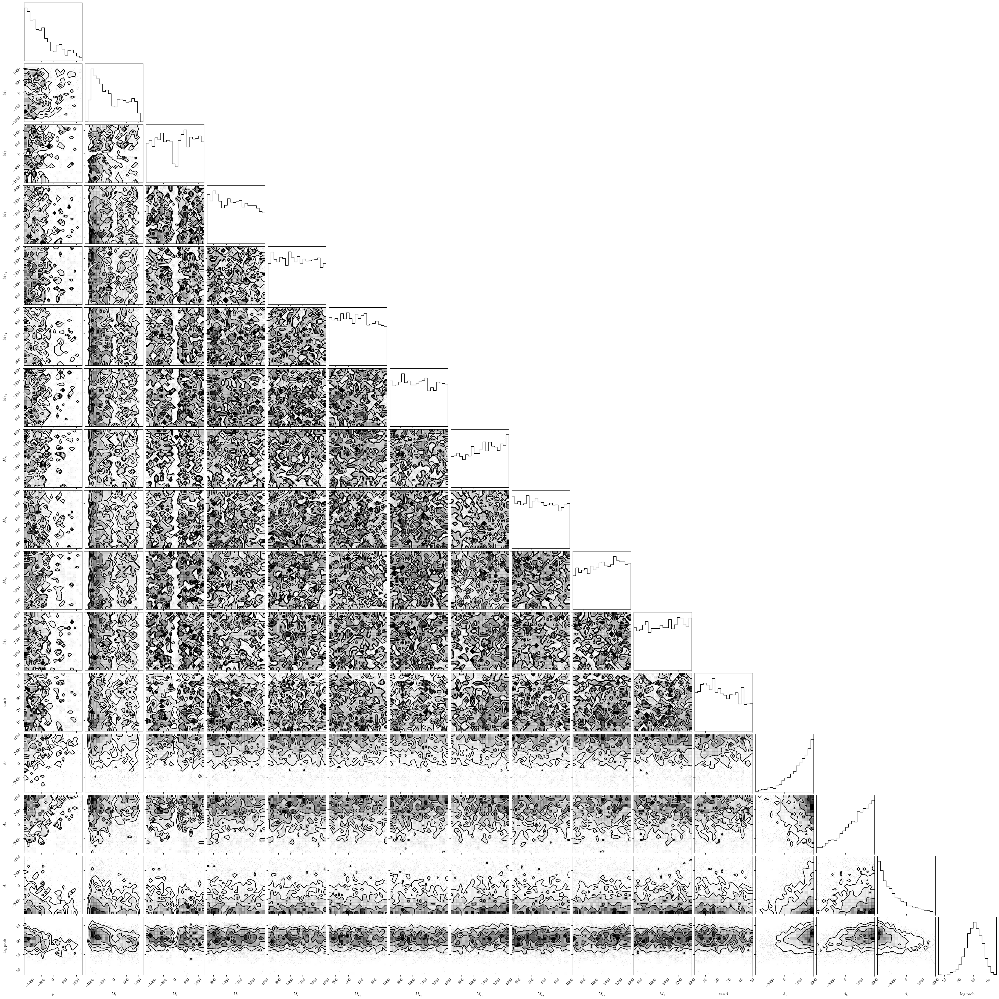

In [14]:
corner.corner(onp.array(unitful_samples), range=ranges, labels=labels)

In [15]:
# --------------------------
# --------------------------
# Run full simulations on the samples
# --------------------------

# First shuffle samples to get a random order
_, _, observables_rng = jax.random.split(rng, num=3)
samples = jax.random.shuffle(observables_rng, samples, axis=0)
# Generate the observables from 2000 samples of the posterior
big_simulator = get_simulator_with_more_observables()

# num_samples = -1  # -1 means all
num_samples = 1000  # -1 means all
results = big_simulator(rng, samples[:num_samples])


/opt/homebrew/Caskroom/miniforge/base/envs/mssm/lib/python3.10/site-packages/jax/_src/random.py:399: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
  0%|          | 0/1 [00:00<?, ?it/s]

143
 There has been a problem during the run.
 Please check the file Messages.out for further information.
 Block 'HMIX', key={ 2} - is absent
can not calculate parameter tB
sortOddparticles err=50
 There has been a problem during the run.
 Please check the file Messages.out for further information.
 Block 'HMIX', key={ 2} - is absent
can not calculate parameter tB
sortOddparticles err=50
 There has been a problem during the run.
 Please check the file Messages.out for further information.
 Block 'HMIX', key={ 2} - is absent
can not calculate parameter tB
sortOddparticles err=50
 There has been a problem during the run.
 Please check the file Messages.out for further information.
 Block 'HMIX', key={ 2} - is absent
can not calculate parameter tB
sortOddparticles err=50
 There has been a problem during the run.
 Please check the file Messages.out for further information.
 Block 'HMIX', key={ 2} - is absent
can not calculate parameter tB
sortOddparticles err=50
 There has been a problem 

100%|██████████| 1/1 [01:16<00:00, 76.71s/it]


In [ ]:
# # --------------------------
# # Save the samples and micromegas results
# # --------------------------
# samples_and_results = results
# samples_and_results["samples"] = unitful_samples[:num_samples]

# hf = h5py.File("samples_and_results_mcmc.h5", "w")
# for key, arr in samples_and_results.items():
#     hf.create_dataset(key, data=arr)
# hf.close()


In [16]:
# --------------------------
# Plot the samples and results
# --------------------------

lower_limits = onp.array(X_true - 3 * X_sigma)
# lower limit for direct detection is 3 sigma excluded
lower_limits[:, 3] = 2 * 0.02275
upper_limits = onp.array(X_true + 3 * X_sigma)
limits = onp.stack([lower_limits, upper_limits]).squeeze()

lp.M1_vs_mchi(samples[:num_samples], results)
lp.plot_observable_corner(X_true, X_sigma, results, logger=logger)
lp.plot_direct_detection_limits(
    results, logger=logger, filename="unfiltered_direct_detection_mcmc.png"
)
lp.plot_mass_splitting(
    results, logger=logger, filename="unfiltered_LHC_constraints_mcmc.png"
)
lp.plot_masses_corner(
    results, logger=logger, filename="unfiltered_masses_corner_mcmc.png"
)

filtered_unitful_samples, filtered_results = lp.filter_observables(
    unitful_samples[:num_samples], results, limits
)

print(filtered_unitful_samples.shape[0], "samples after filtering")

lp.plot_direct_detection_limits(
    filtered_results, logger=logger, filename="direct_detection_mcmc.png"
)
lp.plot_mass_splitting(
    filtered_results, logger=logger, filename="LHC_constraints_mcmc.png"
)
try:
    lp.plot_masses_corner(
        filtered_results, logger=logger, filename="masses_corner_mcmc.png"
    )
except:
    print("Could not plot masses corner")

try:
    corner.corner(onp.array(filtered_unitful_samples), range=ranges, labels=labels)

    if hasattr(logger, "plot"):
        logger.plot(f"Final Corner Plot", plt, close_plot=True)
    else:
        plt.savefig("filtered_posterior_corner_mcmc.png")
    plt.clf()
except:
    print("Could not plot filtered posterior corner")

0 samples after filtering
Could not plot masses corner
Could not plot filtered posterior corner


<Figure size 640x480 with 0 Axes>

<Figure size 760x760 with 0 Axes>

<Figure size 1180x1180 with 0 Axes>